# Part I Exploratory Data Analysis
[Our goal is to build a model to help with categorizing product categories for verizon team] The purpose of the exploratory data analysis is to better understand the contents and structure of the Enterprise Software Products dataset. We will be analyzing the product descriptions to evaluate the quality of the data and to gain insights into the distribution of product details. This will set the foundation for building an NLP model to categorize software products based on their descriptions. We will be reviewing the data quality,and identifying possible trends among product categories to see what features we can emphasize on in future model training

We can first by insepcting the data

In [1]:
import pandas as pd

products_df = pd.read_csv('C:\\Users\\nchen\\Downloads\\products.csv')
categories_df = pd.read_csv('C:\\Users\\nchen\\Downloads\\categories.csv')
sub_categories_df = pd.read_csv('C:\\Users\\nchen\\Downloads\\sub-categories.csv')

print(products_df.head())
print(categories_df.head())
print(sub_categories_df.head())

                product_name                  vendor_name  \
0         Cloud Secure Agent              INFORMATICA LLC   
1  MicroStrategy BI Platform  MICROSTRATEGY SERVICES CORP   
2         Signature Services                 QLIKTECH INC   
3                     VizLib                 QLIKTECH INC   
4      PowerCenter Connector                       ORACLE   

     taxonomy_category                      taxonomy_sub_category  \
0  BI & Data Analytics                            Data Governance   
1  BI & Data Analytics  Self-Serve Visualization & Ent. Reporting   
2  BI & Data Analytics  Self-Serve Visualization & Ent. Reporting   
3  BI & Data Analytics  Self-Serve Visualization & Ent. Reporting   
4  BI & Data Analytics                   Data Movement Management   

                                 product_description  
0  The Informatica Cloud Secure Agent is a lightw...  
1  The MicroStrategy platform supports interactiv...  
2  The Signature Services is a package of key ser... 

We also have to check to confirm if there are any missing values in the data, data types and if there are any repeats in the data

In [2]:
print("Missing values in Products dataset:")
print(products_df.isnull().sum())

print("Missing values in Categories dataset:")
print(categories_df.isnull().sum())

print("Missing values in Sub-Categories dataset:")
print(sub_categories_df.isnull().sum())

# duplicates
print("Duplicate rows in Products dataset:", products_df.duplicated().sum())
print("Duplicate rows in Categories dataset:", categories_df.duplicated().sum())
print("Duplicate rows in Sub-Categories dataset:", sub_categories_df.duplicated().sum())

# data types
print("Data types in Products dataset:")
print(products_df.dtypes)

print("Data types in Categories dataset:")
print(categories_df.dtypes)

print("Data types in Sub-Categories dataset:")
print(sub_categories_df.dtypes)

Missing values in Products dataset:
product_name             0
vendor_name              0
taxonomy_category        0
taxonomy_sub_category    0
product_description      0
dtype: int64
Missing values in Categories dataset:
name          0
definition    0
dtype: int64
Missing values in Sub-Categories dataset:
parent        0
name          0
definition    0
dtype: int64
Duplicate rows in Products dataset: 0
Duplicate rows in Categories dataset: 0
Duplicate rows in Sub-Categories dataset: 0
Data types in Products dataset:
product_name             object
vendor_name              object
taxonomy_category        object
taxonomy_sub_category    object
product_description      object
dtype: object
Data types in Categories dataset:
name          object
definition    object
dtype: object
Data types in Sub-Categories dataset:
parent        object
name          object
definition    object
dtype: object


Since we are working with NLP, we will have to understand the distribution of the text data, we can use word count analysis to see if there are short descriptions

In [15]:
products_df['word_count'] = products_df['product_description'].apply(lambda x: len(str(x).split()))
products_df['char_count'] = products_df['product_description'].apply(lambda x: len(str(x)))
products_df['sentence_count'] = products_df['product_description'].apply(lambda x: len(str(x).split('.')))

# display the statistics
print("Basic Text Statistics for Products")
print(products_df[['product_name', 'word_count', 'char_count', 'sentence_count']].head())

Basic Text Statistics for Products
                product_name  word_count  char_count  sentence_count
0         Cloud Secure Agent          28         202               2
1  MicroStrategy BI Platform          52         433               3
2         Signature Services          39         260               2
3                     VizLib          42         286               3
4      PowerCenter Connector          21         174               2


We can also look at the distribution of products across categories to see if there are categories that needs more data for its products.

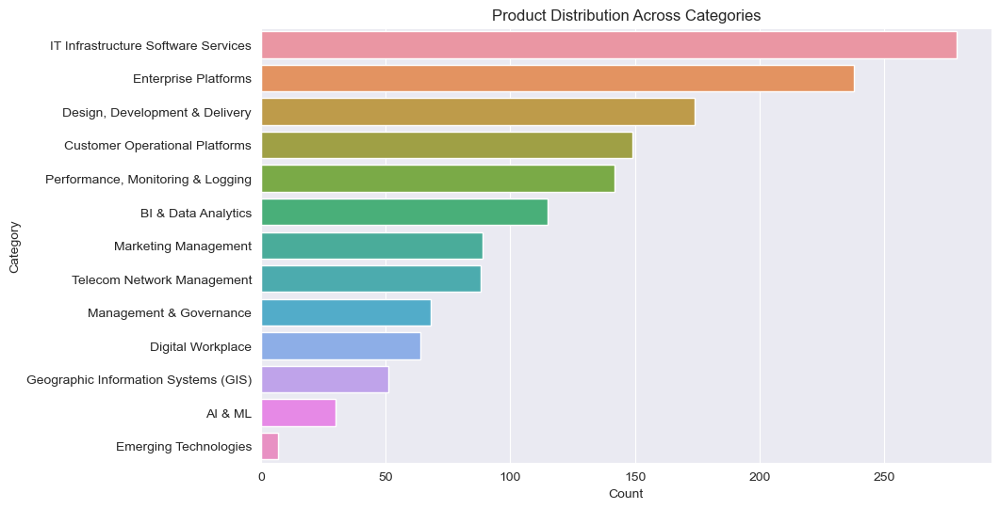

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.countplot(y='taxonomy_category', data=products_df, order=products_df['taxonomy_category'].value_counts().index)
plt.title("Product Distribution Across Categories")
plt.xlabel("Count")
plt.ylabel("Category")
plt.show()

We can see that there is less products for ai & ml and emerging technologies, we can consider looking more into these products later on

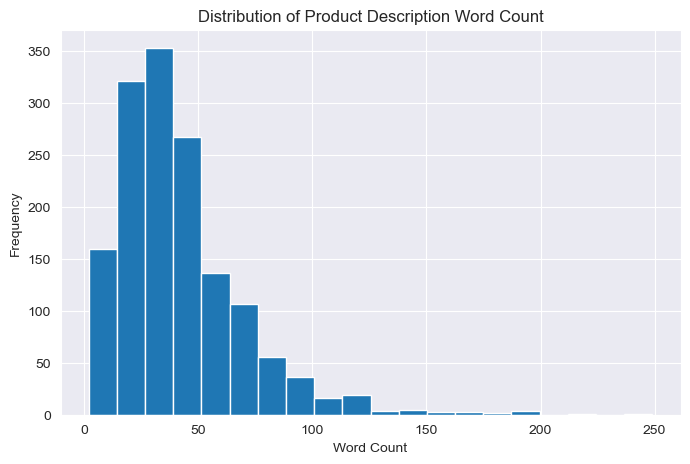

In [5]:
# we can add a column for word count in the product descriptions
products_df['description_word_count'] = products_df['product_description'].apply(lambda x: len(str(x).split()))

# plot histogram
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
products_df['description_word_count'].plot(kind='hist', bins=20)
plt.title('Distribution of Product Description Word Count')
plt.xlabel('Word Count')
plt.ylabel('Frequency')
plt.show()

The majority of the product descriptions contain fewer than 50 words. This is indicated by the high frequency (y - axis) on the side (highest between 25-50). The high frequency of words that are lower than 20 words might indicate that we could need more detail for those words. While the graph that shows those with word counts aove 100 might need review to avoid outliers/skew. Below are two testing methods to take a more detailed look at the data.

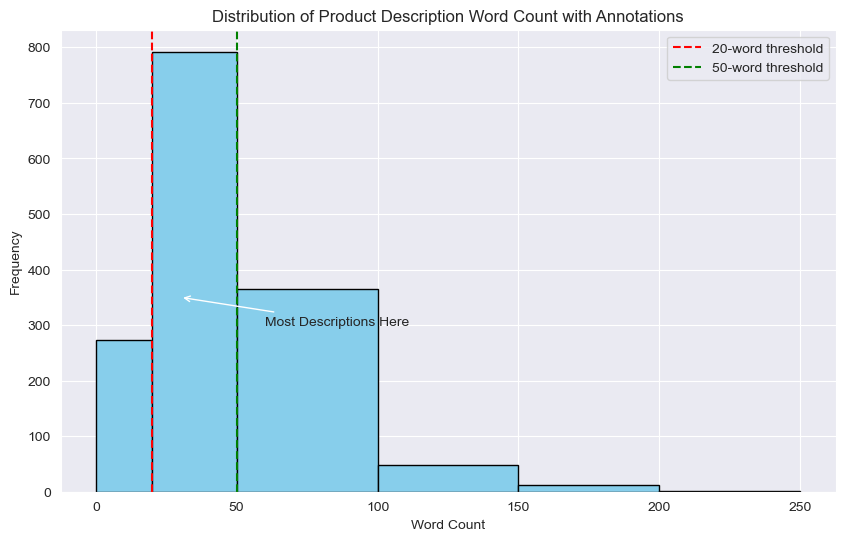

In [46]:
import matplotlib.pyplot as plt

products_df['description_word_count'] = products_df['product_description'].apply(lambda x: len(str(x).split()))

bins = [0, 20, 50, 100, 150, 200, 250]
labels = ['0-20', '21-50', '51-100', '101-150', '151-200', '201-250']

products_df['word_count_category'] = pd.cut(products_df['description_word_count'], bins=bins, labels=labels)

plt.figure(figsize=(10, 6))
plt.hist(products_df['description_word_count'], bins=bins, edgecolor='black', color='skyblue')

plt.axvline(x=20, color='r', linestyle='--', label='20-word threshold')
plt.axvline(x=50, color='g', linestyle='--', label='50-word threshold')

plt.annotate('Most Descriptions Here', xy=(30, 350), xytext=(60, 300),
             arrowprops=dict(facecolor='black', arrowstyle='->'))

# Adding titles and labels
plt.title('Distribution of Product Description Word Count with Annotations')
plt.xlabel('Word Count')
plt.ylabel('Frequency')
plt.legend()

# Display the plot
plt.show()

In [47]:
# thresholds
low_word_count_threshold = 20
high_word_count_threshold = 100

# filter product names for descriptions with low word counts (below 20 words)
low_word_count_products = products_df[products_df['description_word_count'] < low_word_count_threshold]['product_name']

# Filter product names for descriptions with high word counts (above 100 words)
high_word_count_products = products_df[products_df['description_word_count'] > high_word_count_threshold]['product_name']

# display the product names with low word counts
print("Products with Low Word Count (Below 20 words):")
print(low_word_count_products.to_list())  # Print as a list

# display the product names with high word counts
print("\nProducts with High Word Count (Above 100 words):")
print(high_word_count_products.to_list()) 

Products with Low Word Count (Below 20 words):
['FiveTran Essential Platform', 'ThoughtSpot', 'Hyperion BI Analysis Fee', 'Mobile Analytics', 'SISENSE Platform', 'Easy View', 'EMS Workplace', 'Meetings & Incentives Worldwide Managed Services', 'Google Chromebox', 'Jamboard', 'Slido Enterprise', 'Doubledutch (Event CMS)', 'WebEx', 'Connections', 'Moxtra', 'SnagIt', 'Pexip Infinity', 'Bright Talk Webinars', 'Office Professional Plus', 'T1Research', 'Premier Support', 'Skyword360', 'Integration Manager', 'Act On', 'Sendgrid Email', 'Market Analytics and Visualization', 'C2CRM', 'Spectrum Enterprise Geocoding Module', 'GeoIP2', '3-GIS Web', 'Insight Forensic', 'Document and Mail Automation', 'Bill Print - Mailing', 'Payment Suspense Manager', 'Suspense Manager', 'Taxation Manager for Vertex', '8MS Managed Services', 'LiveEngage Managed Services', 'Netcracker', 'VeriFone', 'PSTN Numbering Ranges', 'Speechmatics', 'Argent Basic', 'Interactive Voice Response Analytics (IVRA)', 'Satmetrix NPX'

We should take a note for products that have less words in their descriptions as they might have less in contribution to the data modeling

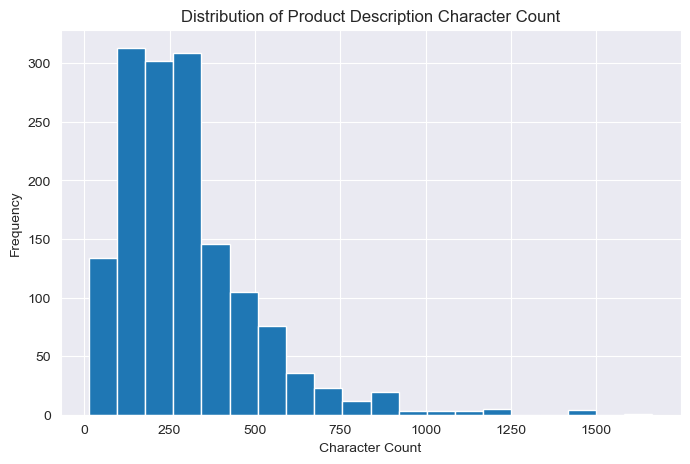

In [8]:
# Adding a column for character count in the product descriptions
products_df['description_char_count'] = products_df['product_description'].apply(lambda x: len(str(x)))

# Plot histogram of character count distribution
plt.figure(figsize=(8, 5))
products_df['description_char_count'].plot(kind='hist', bins=20)
plt.title('Distribution of Product Description Character Count')
plt.xlabel('Character Count')
plt.ylabel('Frequency')
plt.show()

After we have visualized the data we will merge the dataset and start looking at similarities/differences between all the different categories

In [19]:
# Merge products with categories and sub-categories
merged_df = pd.merge(products_df, categories_df, left_on='taxonomy_category', right_on='name', how='left')
merged_df = pd.merge(merged_df, sub_categories_df, left_on='taxonomy_sub_category', right_on='name', how='left')

# Inspect the merged data
print(merged_df.head())

                product_name                  vendor_name  \
0         Cloud Secure Agent              INFORMATICA LLC   
1  MicroStrategy BI Platform  MICROSTRATEGY SERVICES CORP   
2         Signature Services                 QLIKTECH INC   
3                     VizLib                 QLIKTECH INC   
4      PowerCenter Connector                       ORACLE   

     taxonomy_category                      taxonomy_sub_category  \
0  BI & Data Analytics                            Data Governance   
1  BI & Data Analytics  Self-Serve Visualization & Ent. Reporting   
2  BI & Data Analytics  Self-Serve Visualization & Ent. Reporting   
3  BI & Data Analytics  Self-Serve Visualization & Ent. Reporting   
4  BI & Data Analytics                   Data Movement Management   

                                 product_description  word_count  char_count  \
0  The Informatica Cloud Secure Agent is a lightw...          28         202   
1  The MicroStrategy platform supports interactiv...      

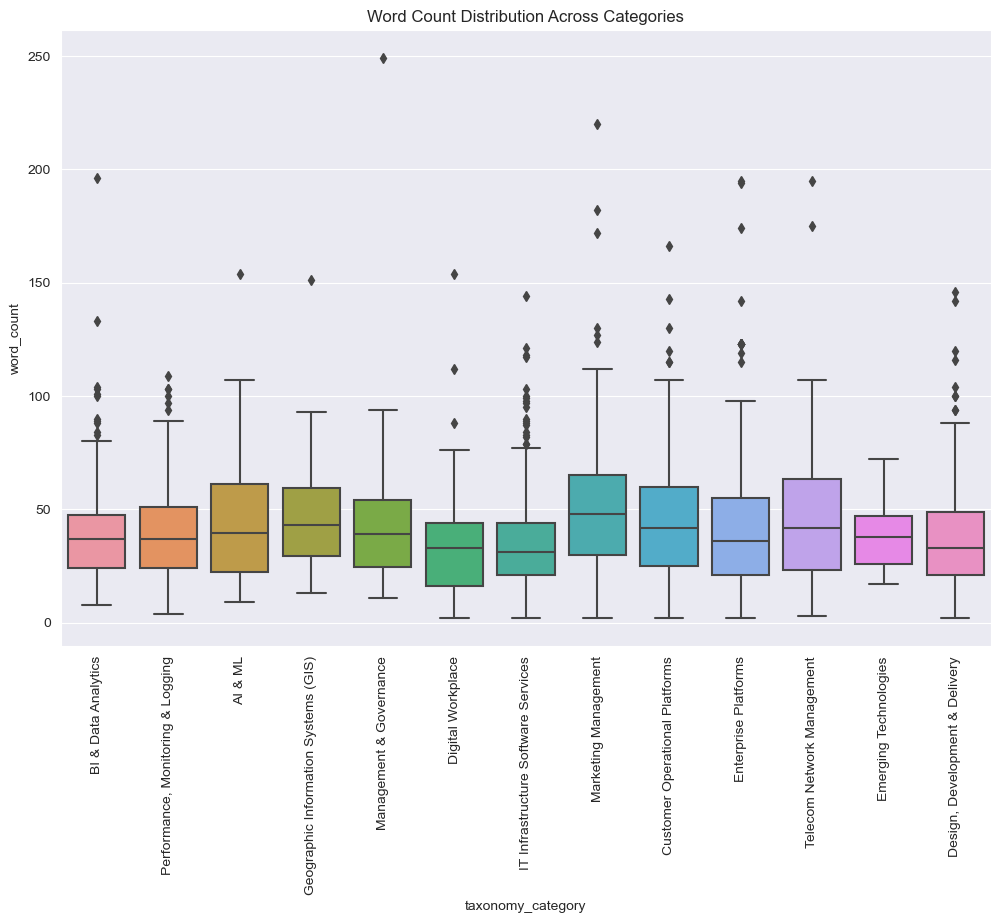

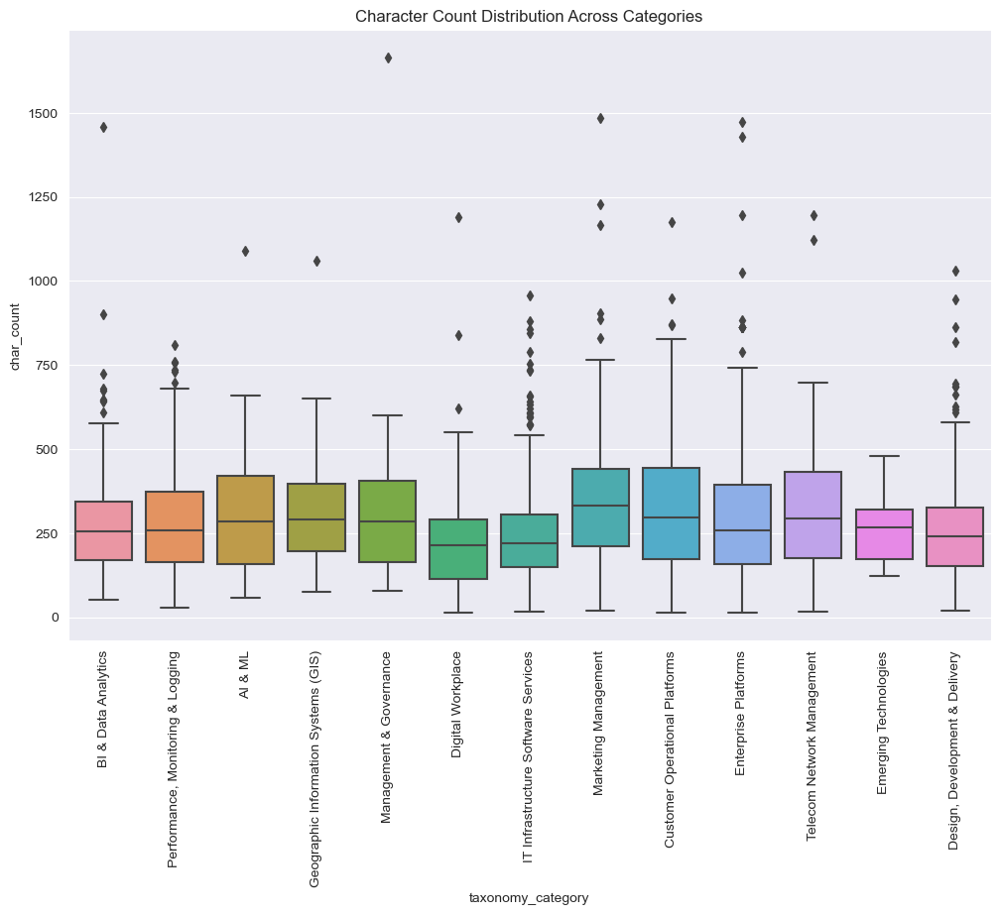

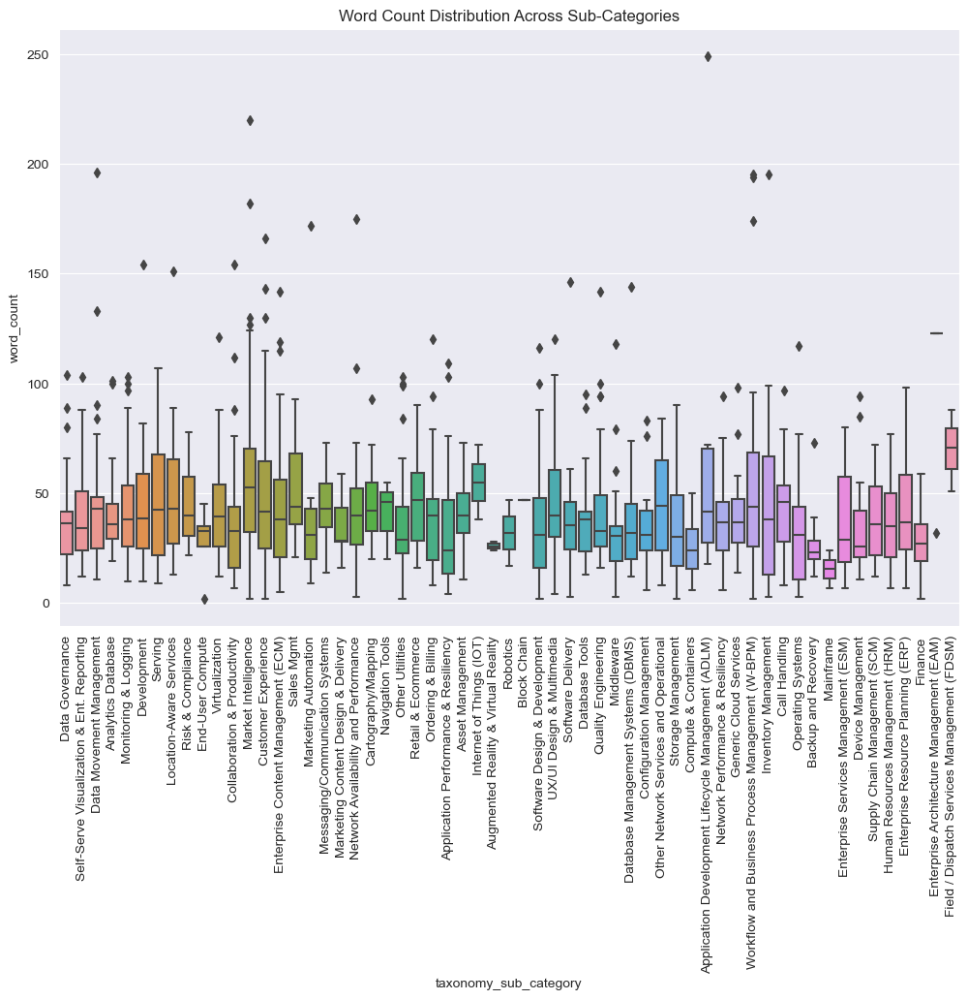

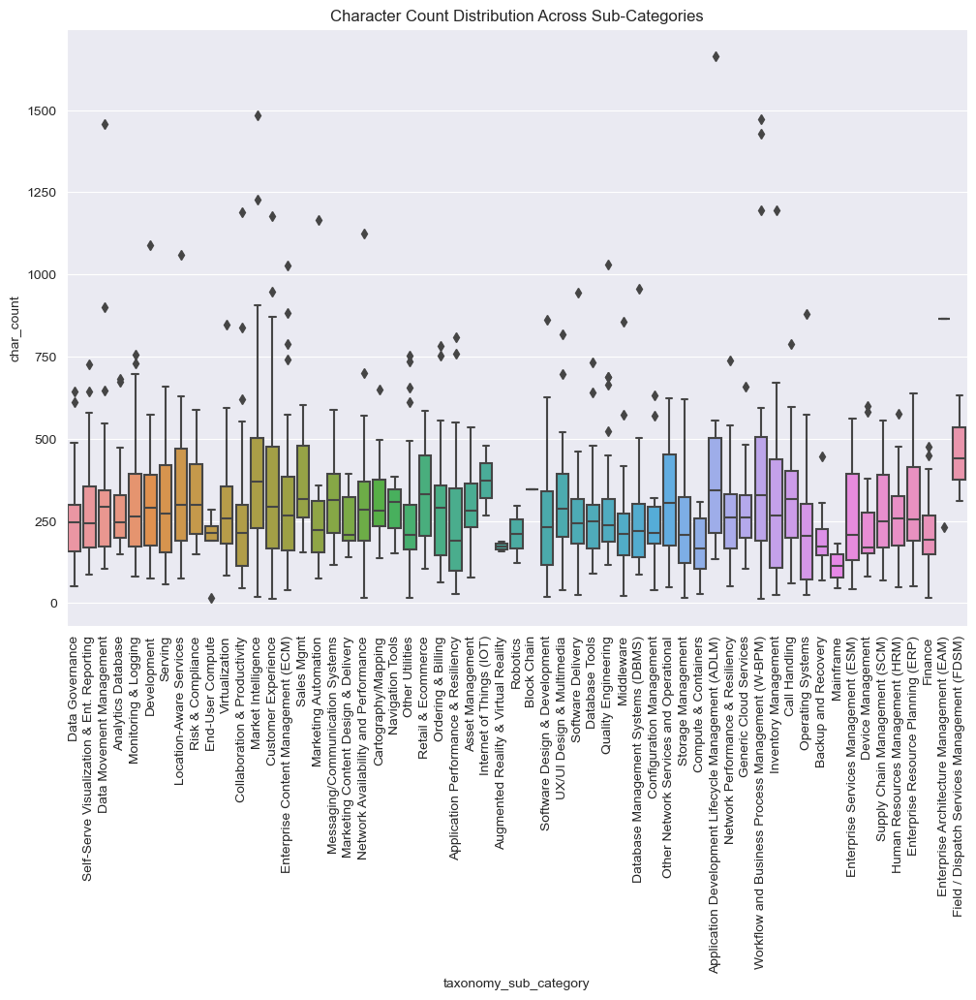

In [48]:

merged_df['word_count'] = merged_df['product_description'].apply(lambda x: len(str(x).split()))
merged_df['char_count'] = merged_df['product_description'].apply(lambda x: len(str(x)))

# Visualize word count distribution across categories
plt.figure(figsize=(12, 8))
sns.boxplot(x='taxonomy_category', y='word_count', data=merged_df)
plt.title("Word Count Distribution Across Categories")
plt.xticks(rotation=90)
plt.show()

# Visualize character count distribution across categories
plt.figure(figsize=(12, 8))
sns.boxplot(x='taxonomy_category', y='char_count', data=merged_df)
plt.title("Character Count Distribution Across Categories")
plt.xticks(rotation=90)
plt.show()

# Visualize word count distribution across sub-categories
plt.figure(figsize=(12, 8))
sns.boxplot(x='taxonomy_sub_category', y='word_count', data=merged_df)
plt.title("Word Count Distribution Across Sub-Categories")
plt.xticks(rotation=90)
plt.show()

# Visualize character count distribution across sub-categories
plt.figure(figsize=(12, 8))
sns.boxplot(x='taxonomy_sub_category', y='char_count', data=merged_df)
plt.title("Character Count Distribution Across Sub-Categories")
plt.xticks(rotation=90)
plt.show()

The word count distribution shows that categories such as **Telecom Network Management**, **Marketing Management**, and **Customer Operational Platforms** have the longest and most variable product descriptions, suggesting these products require more detailed explanations due to their complexity. In contrast, categories like **Digital Workspace** and **Emerging Technologies** exhibit shorter and more consistent word counts, indicating more standardized or straightforward descriptions. The sub-category analysis reveals similar patterns, with sub-categories like **Market intelligence** and **Customer service** and **UI/UX** showing greater variation, while others are more concise. The presence of outliers across both categories and sub-categories indicates that certain products require significantly longer descriptions, which may reflect niche or highly specialized products within these groups. From this we can see which category and sub category tends to have longer description. Below a table is also generated for us to visualize the average word counts across each data, and we can see which ones have a longer description compared to which ones don't

In [50]:
category_stats = merged_df.groupby('taxonomy_category').agg({
    'word_count': ['mean', 'min', 'max'],
    'char_count': ['mean', 'min', 'max']
}).reset_index()

# Rename columns
category_stats.columns = ['Category', 'Avg Word Count', 'Min Word Count', 'Max Word Count', 'Avg Char Count', 'Min Char Count', 'Max Char Count']

# Sort by Avg Word Count (descending) to display categories with longest descriptions first
category_stats = category_stats.sort_values(by='Avg Word Count', ascending=False)

# Format the results for better readability
category_stats_formatted = category_stats.style.format({
    'Avg Word Count': '{:.2f}',
    'Min Word Count': '{:.0f}',
    'Max Word Count': '{:.0f}',
    'Avg Char Count': '{:.2f}',
    'Min Char Count': '{:.0f}',
    'Max Char Count': '{:.0f}'
})

# Display the category-level statistics in a styled table
print("Category-level statistics (sorted by Avg Word Count):")
display(category_stats_formatted)

# Group by sub-category and compute statistics for word and character count
sub_category_stats = merged_df.groupby('taxonomy_sub_category').agg({
    'word_count': ['mean', 'min', 'max'],
    'char_count': ['mean', 'min', 'max']
}).reset_index()


sub_category_stats.columns = ['Sub-Category', 'Avg Word Count', 'Min Word Count', 'Max Word Count', 'Avg Char Count', 'Min Char Count', 'Max Char Count']


sub_category_stats = sub_category_stats.sort_values(by='Avg Word Count', ascending=False)


sub_category_stats_formatted = sub_category_stats.style.format({
    'Avg Word Count': '{:.2f}',
    'Min Word Count': '{:.0f}',
    'Max Word Count': '{:.0f}',
    'Avg Char Count': '{:.2f}',
    'Min Char Count': '{:.0f}',
    'Max Char Count': '{:.0f}'
})

print("\nSub-Category-level statistics (sorted by Avg Word Count):")
display(sub_category_stats_formatted)

Category-level statistics (sorted by Avg Word Count):


,Category,Avg Word Count,Min Word Count,Max Word Count,Avg Char Count,Min Char Count,Max Char Count
10,Marketing Management,54.34,2,220,378.45,19,1485
7,Geographic Information Systems (GIS),47.69,13,151,326.47,76,1060
2,Customer Operational Platforms,46.60,2,166,335.99,13,1176
0,AI & ML,46.10,9,154,317.83,57,1089
12,Telecom Network Management,45.81,3,195,319.40,16,1195
9,Management & Governance,44.21,11,249,317.87,77,1664
6,Enterprise Platforms,43.39,2,195,309.84,13,1473
1,BI & Data Analytics,42.97,8,196,300.43,52,1457
11,"Performance, Monitoring & Logging",40.31,4,109,291.04,28,810
5,Emerging Technologies,39.00,17,72,264.57,122,478



Sub-Category-level statistics (sorted by Avg Word Count):


,Sub-Category,Avg Word Count,Min Word Count,Max Word Count,Avg Char Count,Min Char Count,Max Char Count
20,Enterprise Architecture Management (EAM),112.89,32,123,793.56,230,864
24,Field / Dispatch Services Management (FDSM),70.00,51,88,461.33,312,631
1,Application Development Lifecycle Management (ADLM),60.50,18,249,444.67,133,1664
32,Market Intelligence,60.45,2,220,417.07,19,1485
58,Workflow and Business Process Management (W-BPM),57.70,2,195,418.04,13,1473
28,Internet of Things (IOT),55.00,38,72,372.00,266,478
49,Sales Mgmt,50.23,21,93,353.60,155,602
14,Data Movement Management,49.79,11,196,347.71,103,1457
29,Inventory Management,49.45,3,195,336.55,26,1195
30,Location-Aware Services,49.16,13,151,338.94,76,1060


We can use ngram to see the most common words in each category

In [52]:
from sklearn.feature_extraction.text import CountVectorizer

# tokenization and N-Gram Analysis
vectorizer = CountVectorizer(stop_words='english', ngram_range=(1, 2), max_features=20)

# apply vectorizer to each category's product descriptions
for category in merged_df['taxonomy_category'].unique():
    category_data = merged_df[merged_df['taxonomy_category'] == category]['product_description']
    ngram_matrix = vectorizer.fit_transform(category_data.dropna())
    
    print(f"Category: {category}")
    print(f"Most common words/n-grams: {vectorizer.get_feature_names_out()}\n")

Category: BI & Data Analytics
Most common words/n-grams: ['analytics' 'applications' 'based' 'business' 'business intelligence'
 'cloud' 'data' 'enterprise' 'ibm' 'informatica' 'integration'
 'intelligence' 'management' 'platform' 'provides' 'service' 'software'
 'source' 'time' 'users']

Category: Performance, Monitoring & Logging
Most common words/n-grams: ['application' 'applications' 'asg' 'cloud' 'data' 'enterprise'
 'infrastructure' 'management' 'monitor' 'monitoring' 'network'
 'operations' 'performance' 'platform' 'provides' 'service' 'services'
 'software' 'solution' 'time']

Category: AI & ML
Most common words/n-grams: ['ai' 'analytics' 'applications' 'bots' 'cloud' 'customer' 'data'
 'enables' 'human' 'ibm' 'language' 'learning' 'machine'
 'machine learning' 'natural' 'network' 'platform' 'provides' 'service'
 'speech']

Category: Geographic Information Systems (GIS)
Most common words/n-grams: ['accurate' 'address' 'data' 'information' 'location' 'mapping' 'maps'
 'network' 

In [53]:
# n-Gram analysis for sub-categories
for sub_category in merged_df['taxonomy_sub_category'].unique():
    sub_category_data = merged_df[merged_df['taxonomy_sub_category'] == sub_category]['product_description']
    ngram_matrix = vectorizer.fit_transform(sub_category_data.dropna())
    
    print(f"Sub-Category: {sub_category}")
    print(f"Most common words/n-grams: {vectorizer.get_feature_names_out()}\n")

Sub-Category: Data Governance
Most common words/n-grams: ['analyze' 'applications' 'business' 'catalog' 'cloud' 'country' 'create'
 'data' 'data catalog' 'data governance' 'data quality' 'enterprise'
 'governance' 'ibm' 'informatica' 'informatica data' 'management'
 'organization' 'platform' 'quality']

Sub-Category: Self-Serve Visualization & Ent. Reporting
Most common words/n-grams: ['analysis' 'analytics' 'based' 'bi' 'business' 'business intelligence'
 'cloud' 'data' 'enterprise' 'ibm' 'insights' 'intelligence' 'management'
 'platform' 'reporting' 'software' 'statistical' 'tool' 'users'
 'visualize']

Sub-Category: Data Movement Management
Most common words/n-grams: ['analytics' 'application' 'business' 'cloud' 'consecutive'
 'consecutive month' 'data' 'data integration' 'enterprise' 'ibm'
 'informatica' 'informatica cloud' 'integration' 'management' 'month'
 'real' 'service' 'test' 'test data' 'time']

Sub-Category: Analytics Database
Most common words/n-grams: ['analytics' 'busin

In [54]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

# Function to get top n words from a corpus
def get_top_n_words(corpus, n=10):
    vec = CountVectorizer(stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

# Get Top 10 Common Words for Each Category
print("Top 10 Common Words by Category:")
for category in merged_df['taxonomy_category'].unique():
    category_data = merged_df[merged_df['taxonomy_category'] == category]['product_description'].dropna()
    top_words = get_top_n_words(category_data, 15)
    print(f"\nCategory: {category}")
    print(f"Top 15 common words: {top_words}")

# Get Top 10 Common Words for Each Sub-Category
print("\nTop 10 Common Words by Sub-Category:")
for sub_category in merged_df['taxonomy_sub_category'].unique():
    sub_category_data = merged_df[merged_df['taxonomy_sub_category'] == sub_category]['product_description'].dropna()
    top_words = get_top_n_words(sub_category_data, 15)
    print(f"\nSub-Category: {sub_category}")
    print(f"Top 15 common words: {top_words}")

Top 10 Common Words by Category:

Category: BI & Data Analytics
Top 15 common words: [('data', 256), ('business', 54), ('cloud', 49), ('analytics', 44), ('platform', 40), ('enterprise', 37), ('informatica', 29), ('management', 27), ('intelligence', 23), ('software', 23), ('integration', 22), ('service', 22), ('ibm', 22), ('applications', 19), ('source', 19)]

Category: Performance, Monitoring & Logging
Top 15 common words: [('performance', 81), ('network', 80), ('monitoring', 75), ('data', 70), ('management', 52), ('provides', 38), ('asg', 37), ('application', 36), ('infrastructure', 35), ('monitor', 33), ('software', 33), ('platform', 29), ('solution', 27), ('cloud', 25), ('services', 24)]

Category: AI & ML
Top 15 common words: [('data', 29), ('platform', 16), ('ai', 12), ('applications', 11), ('service', 10), ('network', 9), ('learning', 8), ('cloud', 8), ('natural', 7), ('machine', 7), ('speech', 7), ('analytics', 7), ('bots', 6), ('provides', 6), ('customer', 6)]

Category: Geogra

In [55]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Function to get top n unique words using TF-IDF
def get_top_tfidf_words(corpus, n=10):
    tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=n)
    tfidf_matrix = tfidf_vectorizer.fit_transform(corpus)
    feature_names = tfidf_vectorizer.get_feature_names_out()
    return feature_names

# Get Top 10 Unique Words for Each Category
print("Top 10 Unique Words by Category (using TF-IDF):")
for category in merged_df['taxonomy_category'].unique():
    category_data = merged_df[merged_df['taxonomy_category'] == category]['product_description'].dropna()
    top_unique_words = get_top_tfidf_words(category_data, 10)
    print(f"\nCategory: {category}")
    print(f"Top 10 unique words: {top_unique_words}")

# Get Top 10 Unique Words for Each Sub-Category
print("\nTop 10 Unique Words by Sub-Category (using TF-IDF):")
for sub_category in merged_df['taxonomy_sub_category'].unique():
    sub_category_data = merged_df[merged_df['taxonomy_sub_category'] == sub_category]['product_description'].dropna()
    top_unique_words = get_top_tfidf_words(sub_category_data, 10)
    print(f"\nSub-Category: {sub_category}")
    print(f"Top 10 unique words: {top_unique_words}")

Top 10 Unique Words by Category (using TF-IDF):

Category: BI & Data Analytics
Top 10 unique words: ['analytics' 'business' 'cloud' 'data' 'enterprise' 'informatica'
 'intelligence' 'management' 'platform' 'software']

Category: Performance, Monitoring & Logging
Top 10 unique words: ['application' 'asg' 'data' 'infrastructure' 'management' 'monitoring'
 'network' 'performance' 'provides' 'software']

Category: AI & ML
Top 10 unique words: ['ai' 'analytics' 'applications' 'cloud' 'data' 'learning' 'natural'
 'network' 'platform' 'service']

Category: Geographic Information Systems (GIS)
Top 10 unique words: ['address' 'data' 'location' 'mapping' 'maps' 'postal' 'provides' 'real'
 'service' 'time']

Category: Management & Governance
Top 10 unique words: ['based' 'cloud' 'data' 'manage' 'management' 'platform' 'project'
 'provides' 'software' 'solution']

Category: Digital Workplace
Top 10 unique words: ['applications' 'apps' 'based' 'cloud' 'collaboration' 'management'
 'microsoft' 'offi

In this process, we use TF-IDF (Term Frequency-Inverse Document Frequency) to identify the most unique and distinctive words for each category and sub-category in the dataset. TF-IDF assigns higher scores to words that appear frequently in a specific category but less frequently across all categories, helping to highlight words that are more representative of each group. We apply the TfidfVectorizer to the product descriptions of each category and sub-category to extract the top 10 unique words that are more tailored toward their respective groups. This analysis helps us understand which words are more specific to a particular category or sub-category, differentiating the products across the dataset. The result is a list of the most important and distinctive terms for each group, which can later assist in building a classification model.

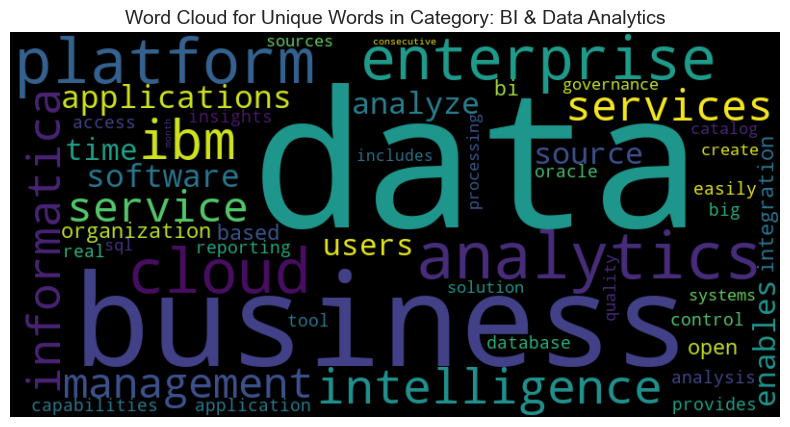

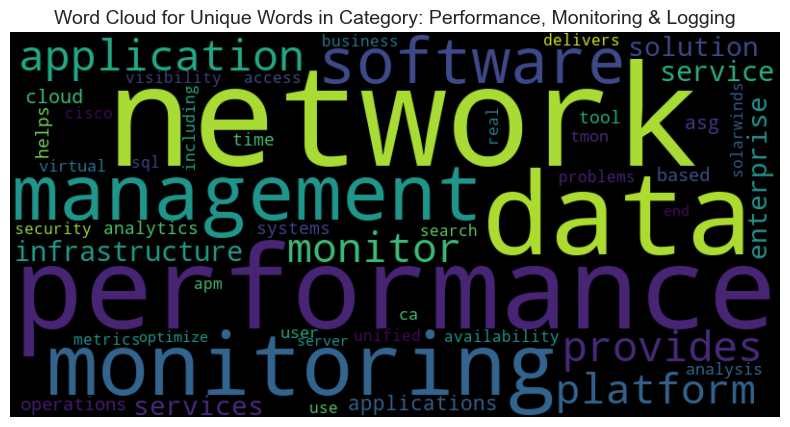

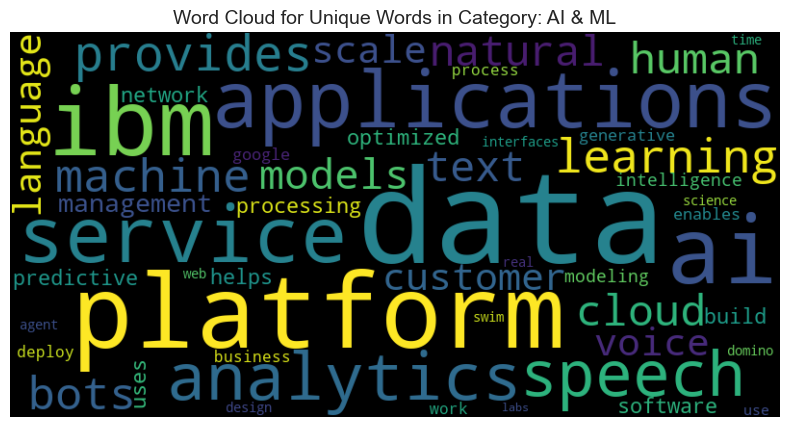

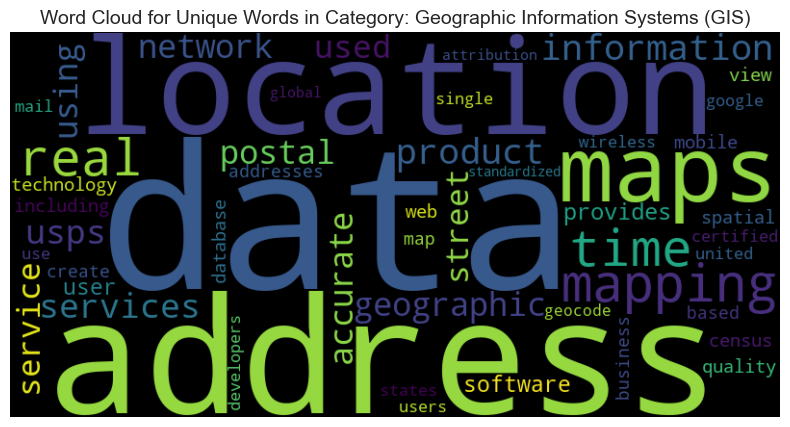

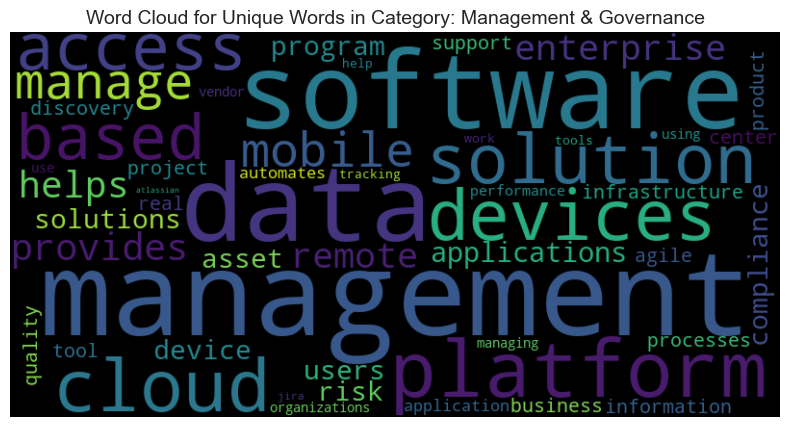

...

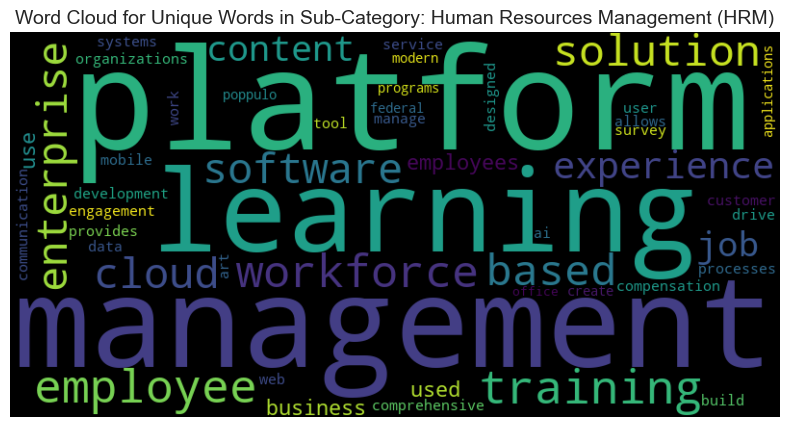

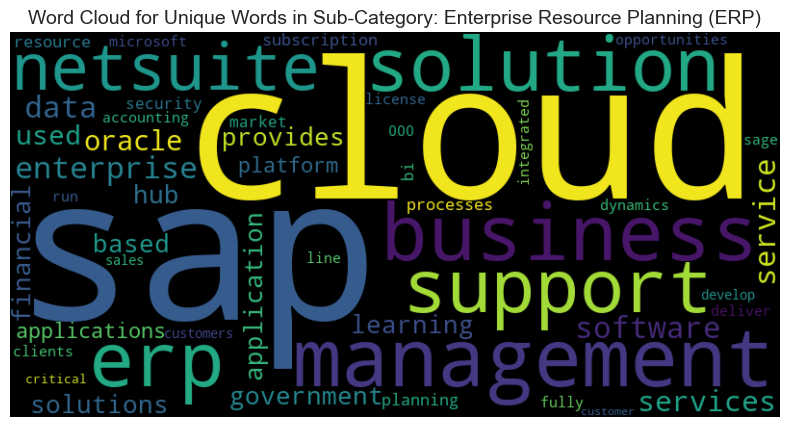

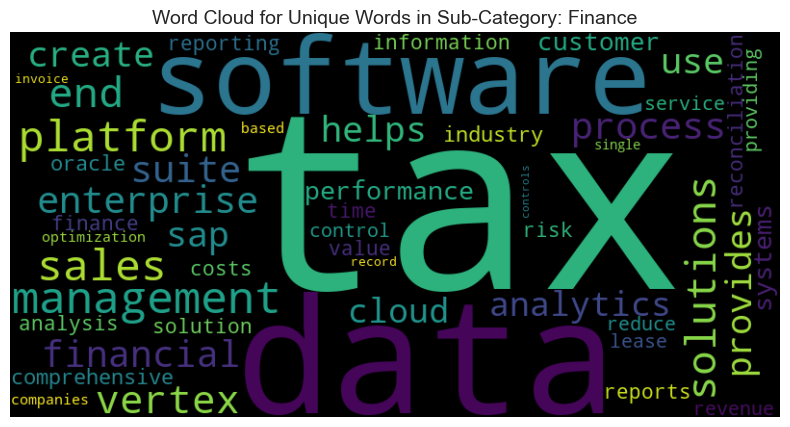

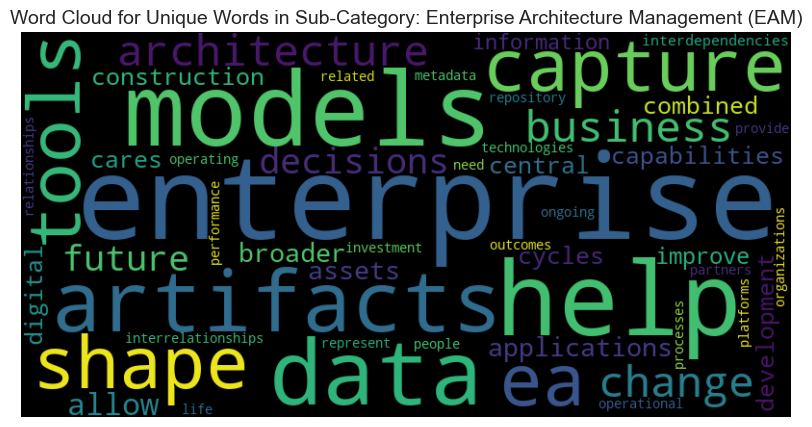

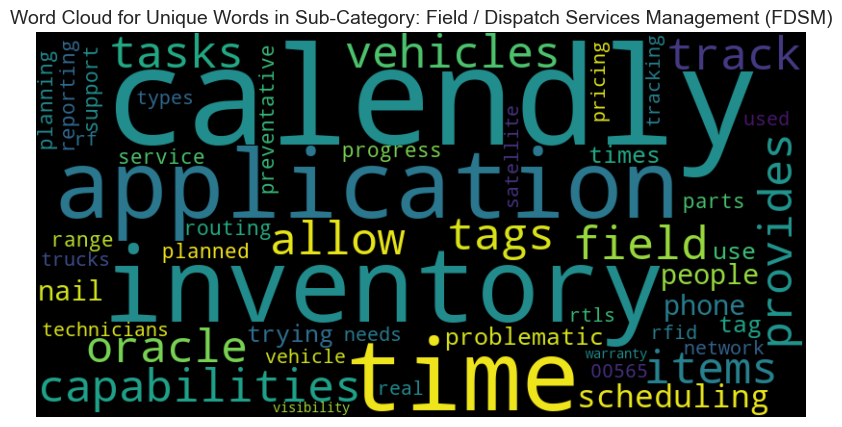

In [56]:
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Function to get top n unique words using TF-IDF and their corresponding TF-IDF scores
def get_top_tfidf_words_with_scores(corpus, n=50):
    tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=n)
    tfidf_matrix = tfidf_vectorizer.fit_transform(corpus)
    feature_names = tfidf_vectorizer.get_feature_names_out()
    tfidf_scores = tfidf_matrix.toarray().sum(axis=0)
    return dict(zip(feature_names, tfidf_scores))

# Function to generate a word cloud
def generate_wordcloud_from_tfidf(tfidf_dict, title):
    wordcloud = WordCloud(width=800, height=400, background_color='black').generate_from_frequencies(tfidf_dict)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title, fontsize=14)
    plt.show()

# Generate Word Cloud for Each Category using top unique words from TF-IDF
for category in merged_df['taxonomy_category'].unique():
    category_data = merged_df[merged_df['taxonomy_category'] == category]['product_description'].dropna()
    tfidf_dict = get_top_tfidf_words_with_scores(category_data, 50)  # Top 50 unique words
    generate_wordcloud_from_tfidf(tfidf_dict, f'Word Cloud for Unique Words in Category: {category}')

# Generate Word Cloud for Each Sub-Category using top unique words from TF-IDF
for sub_category in merged_df['taxonomy_sub_category'].unique():
    sub_category_data = merged_df[merged_df['taxonomy_sub_category'] == sub_category]['product_description'].dropna()
    tfidf_dict = get_top_tfidf_words_with_scores(sub_category_data, 50)  # Top 50 unique words
    generate_wordcloud_from_tfidf(tfidf_dict, f'Word Cloud for Unique Words in Sub-Category: {sub_category}')

LDA Can help with the following:
identify Key Themes: LDA shows the main words that describe each category, like "data" and "analytics" for BI & Data Analytics or "service" and "network" for Telecom Network Management.

Useful Features for Models: The common words found by LDA can be used to help machine learning models categorize new products by focusing on words that stand out in each category.

Improve Product Descriptions: LDA helps optimize product descriptions by making sure important terms are included, making it easier to categorize and find products.

In [44]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import TfidfVectorizer

# Define the TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english')

# Apply LDA to find topics in product descriptions
lda = LatentDirichletAllocation(n_components=5, random_state=42)

# Loop through each category and apply LDA
for category in merged_df['taxonomy_category'].unique():
    category_data = merged_df[merged_df['taxonomy_category'] == category]['product_description'].dropna()
    tfidf_matrix = tfidf_vectorizer.fit_transform(category_data)
    lda.fit(tfidf_matrix)
    
    print(f"Category: {category}")
    print(f"Top words per topic for LDA:")
    
    for idx, topic in enumerate(lda.components_):
        print(f"Topic {idx + 1}: ", [tfidf_vectorizer.get_feature_names_out()[i] for i in topic.argsort()[-10:]])
    print("\n")

Category: BI & Data Analytics
Top words per topic for LDA:
Topic 1:  ['integration', 'ibm', 'service', 'analytics', 'informatica', 'cloud', 'platform', 'enterprise', 'business', 'data']
Topic 2:  ['collibra', 'business', 'management', 'enables', 'enterprise', 'platform', 'provides', 'catalog', 'query', 'data']
Topic 3:  ['source', 'cdp', 'analytics', 'platform', 'hdp', 'new', 'ibm', 'large', 'cloud', 'data']
Topic 4:  ['make', 'decisions', 'search', 'discover', 'analyze', 'analytics', 'business', 'intelligence', 'organization', 'data']
Topic 5:  ['bi', 'cloud', 'sap', 'insights', 'premium', 'informatica', 'business', 'enterprise', 'analytics', 'data']


Category: Performance, Monitoring & Logging
Top words per topic for LDA:
Topic 1:  ['apm', 'cloud', 'ca', 'helps', 'management', 'operations', 'systems', 'application', 'performance', 'data']
Topic 2:  ['os', 'systems', 'services', 'nagios', 'application', 'sql', 'network', 'monitoring', 'tmon', 'asg']
Topic 3:  ['application', 'softwar

**Analysis for the above data**
BI & Data Analytics: The topics highlight the focus on data integration, analytics, and business intelligence. Common terms like "data," "analytics," "platform," and "cloud" suggest a strong emphasis on data-driven decision-making and cloud-based platforms. There are also references to specific tools like Informatica and Collibra, indicating key players in this space.

Performance, Monitoring & Logging: The top words in this category revolve around application performance monitoring (APM) and network monitoring. Tools like Nagios, Splunk, and SolarWinds appear frequently, indicating the centrality of monitoring solutions for ensuring system performance and managing infrastructure.

AI & ML: The LDA results here focus heavily on AI platforms, bots, and machine learning applications. Words like "agent," "generative," "modeling," and "natural" suggest an interest in AI-driven solutions and machine learning models. This category’s topics reflect a strong focus on building AI applications at scale.

Geographic Information Systems (GIS): GIS topics reflect the importance of location-based data, mapping, and spatial analysis. Terms like "location," "maps," "census," and "address" dominate the topics, reflecting the utility of GIS technology for various sectors that depend on geographic data.

Management & Governance: This category centers on project management, governance, and risk management. Topics like "risk," "assets," and "governance" suggest a focus on ensuring compliance and managing enterprise projects. Specific tools like JIRA and BigFix show the importance of project management software.

Digital Workplace: LDA topics here highlight tools like Microsoft 365, Slack, and Citrix, reflecting the importance of collaboration tools and cloud-based office productivity software in supporting a remote or hybrid work environment. Terms like "productivity," "cloud," and "virtual" reinforce this focus.

IT Infrastructure Software Services: Common themes include cloud services, storage, and database management. Words like "storage," "database," and "platform" highlight the focus on data management and infrastructure solutions. Tools like Oracle and Amazon Web Services reflect key service providers.

Marketing Management: The recurring topics here emphasize customer relationship management (CRM), analytics, and marketing automation. Words like "CRM," "customers," "salesforce," and "email" point to the centrality of customer data platforms and marketing technologies in managing customer interactions.

Customer Operational Platforms: The focus is on customer management, communications, and revenue operations. Frequent words like "customer," "billing," "communications," and "platform" reflect the importance of tools that help manage customer relationships and streamline operations.

Enterprise Platforms: Key terms include ERP, SAP, and business process management (BPM). This category is focused on enterprise resource planning and automation, with tools for managing large-scale operations and business processes like SAP and EA frameworks.

Telecom Network Management: This category’s topics center around network operations, 5G, and service management. Words like "network," "management," "5G," and "operations" suggest a focus on managing complex telecom networks, including both hardware and software aspects.

Emerging Technologies: The topics show a focus on new technologies like IoT, augmented reality, and blockchain. Words like "virtual," "reality," "robots," and "web" highlight cutting-edge technologies and platforms designed to integrate new developments in the tech space.

We can use NER to help  identify key entities like organizations, people, and locations in text.

In [43]:
import spacy

nlp = spacy.load("en_core_web_sm")

# Perform NER for each category
for category in merged_df['taxonomy_category'].unique():
    category_data = merged_df[merged_df['taxonomy_category'] == category]['product_description'].dropna()
    text = ' '.join(category_data)
    
    # Process the text for NER
    doc = nlp(text)
    
    print(f"Category: {category}")
    print("Named Entities:")
    for ent in doc.ents:
        print(ent.text, ent.label_)
    print("\n")

Category: BI & Data Analytics
Named Entities:
Informatica Intelligent Cloud Services ORG
MicroStrategy ORG
BI ORG
HyperIntelligence ORG
MicroStrategy ORG
one CARDINAL
The Signature Services ORG
Customer ORG
Vizlib PERSON
third ORDINAL
Qlik Sense PERSON
Qlik Engine API LOC
Qlik Sense PERSON
Informatica PowerCenter ORG
PowerConnect Adapters ORG
Fivetran PERSON
Alteryx Server PERSON
BI GPE
Hyperion BI Development Analysis ORG
Wireless ORG
BI ORG
Domo, Inc ORG
Looker ORG
Amazon Kinesis Data Firehose ORG
Amazon Simple Storage Service AWS ORG
ETL ORG
Amazon Mobile Analytics ORG
Apache Hadoop ORG
Spark ORG
Opensource Apache Superset ORG
Cloudera Dataflow PERSON
CDF ORG
DataFlow PRODUCT
Cloudera PERSON
Hortonworks Data Platform ( LAW
HDP ORG
HDP ORG
Erwin Data Modeler ORG
DM GPE
ERwin ORG
Data Modeler PERSON
All Fusion Data Modeler ORG
ERwin ORG
Data Modeler PERSON
Data Modeler ORG
Informatica Data Quality ORG
Informatica ORG
Model ORG
Informatica Data Quality ORG
The Right Deployment Model fo

BI & Data Analytics: Entities like Informatica, MicroStrategy, Amazon Kinesis, Apache Hadoop, and IBM dominate, showing the prevalence of key BI tools and platforms.

Performance, Monitoring & Logging: Key entities include Grafana, Datadog, SolarWinds, and Dynatrace, reflecting tools used for monitoring and performance management.

AI & ML: Important entities like IBM, Amazon Comprehend, DataRobot, and Nuance show the focus on AI tools, machine learning platforms, and cloud-based AI services.

GIS (Geographic Information Systems): Entities like Google Maps, Esri, Pitney Bowes, and USPS highlight key players in mapping, location services, and geospatial analytics.

Management & Governance: Tools like Jira, Atlassian, and SAP indicate the prominence of project management and governance software.

Digital Workplace: Entities such as Slack, Microsoft Teams, Citrix, and Google Workspace dominate, pointing to collaboration and productivity tools.

IT Infrastructure Software Services: Key platforms like Microsoft, AWS, IBM, and Oracle show tools for IT infrastructure management.

Marketing Management: Entities like Salesforce, Adobe, Tealium, and Google Analytics dominate, highlighting platforms used in customer journey and marketing analytics.

Customer Operational Platforms: Tools like Salesforce, Oracle, and Verint are prevalent in managing customer service and operational workflows.

Telecom Network Management: Entities like Cisco, Ericsson, F5 Networks, and SDN dominate, emphasizing telecom network management platforms.

Emerging Technologies: Entities like UiPath, IoT, and Edge Computing highlight innovations in automation, IoT, and edge technologies.

What we can do with these data:
1. **Feature Engineering**:
 NER results can be used  to create entity-based features, such as binary or frequency indicators for organizations, products, or technologies. These entities can be grouped into broader categories (e.g., cloud platforms, analytics tools) to generate more abstract features that enhance model input. LDA results, on the other hand, allow us to extract topic-based features, where each document is represented as a mixture of topics. These features can be used in classification models or for clustering similar products based on topic distributions.
2. We can also
Group similar entities into broader categories (e.g., cloud platforms, analytics tools) and use these as features. This could help distinguish products by the technology stack they rely on.

2. **Model Building**:
The extracted NER and LDA features can be integrated into various models, such as text classification, where they help categorize product descriptions into relevant categories like BI, AI, or Telecom. Additionally, these features are useful in recommendation systems, where they help identify and suggest similar products based on shared entities or topics. For clustering and segmentation, the combination of entities and topics can reveal hidden patterns in the data, improving the precision of product groupings.

3. **Improving Model Accuracy**:
Incorporating NER and LDA features into the dataset can provide models with more context and improving their accuracy in classification, recommendation, or clustering tasks. The LDA topics also help reduce high-dimensional text data into fewer, interpretable components, making models more efficient.

In [45]:
from nltk.tokenize import word_tokenize
import nltk

nltk.download('punkt')

# Tokenize the product descriptions for each category
merged_df['tokenized_description'] = merged_df['product_description'].apply(lambda x: word_tokenize(str(x).lower()) if pd.notnull(x) else [])

# Display the tokenized descriptions
print(merged_df[['taxonomy_category', 'product_description', 'tokenized_description']].head())

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\nchen\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


     taxonomy_category                                product_description  \
0  BI & Data Analytics  The Informatica Cloud Secure Agent is a lightw...   
1  BI & Data Analytics  The MicroStrategy platform supports interactiv...   
2  BI & Data Analytics  The Signature Services is a package of key ser...   
3  BI & Data Analytics  Vizlib is a fully supported third-party visual...   
4  BI & Data Analytics  Informatica PowerCenter and PowerConnect Adapt...   

                               tokenized_description  
0  [the, informatica, cloud, secure, agent, is, a...  
1  [the, microstrategy, platform, supports, inter...  
2  [the, signature, services, is, a, package, of,...  
3  [vizlib, is, a, fully, supported, third-party,...  
4  [informatica, powercenter, and, powerconnect, ...  
